In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score , roc_curve
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv("D:\My Downloads\winequality-red.csv-main\winequality-red.csv-main\winequality-red.csv")

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
set(df.quality)  # so we have total 6 classes in the target variable

{3, 4, 5, 6, 7, 8}

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# have the x and y data

x = df.drop(columns='quality')

In [8]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [9]:
y =df.quality

In [10]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [ ]:
# in this data set there are no missing values and most of the data is normally distributed, so we are directly building the model

In [11]:
# train and test split

x_train,x_test,y_train,y_test = train_test_split(x,y, test_size=0.25, random_state = 30)

In [12]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.620,0.12,1.8,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,9.0,0.785,0.24,1.7,0.078,10.0,21.0,0.99692,3.29,0.67,10.0
500,7.8,0.520,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
941,9.9,0.270,0.49,5.0,0.082,9.0,17.0,0.99484,3.19,0.52,12.5


In [13]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.20,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.40,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.50,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.20,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.40,0.071,8.0,19.0,0.99630,3.56,0.73,10.6
...,...,...,...,...,...,...,...,...,...,...,...
721,8.9,0.480,0.24,2.85,0.094,35.0,106.0,0.99820,3.10,0.53,9.2
490,9.3,0.775,0.27,2.80,0.078,24.0,56.0,0.99840,3.31,0.67,10.6
575,12.3,0.270,0.49,3.10,0.079,28.0,46.0,0.99930,3.20,0.80,10.2
1051,8.5,0.460,0.59,1.40,0.414,16.0,45.0,0.99702,3.03,1.34,9.2


In [14]:
dt_model = DecisionTreeClassifier()

In [15]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [16]:
# lets visiualise the tree which is built

import sklearn
import matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline

In [17]:
# check the version of sklearn I am using

sklearn.__version__



'0.23.1'

[Text(612.3411014089829, 1057.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(359.4493427445476, 996.6, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(223.6751916432736, 936.2, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(80.97837939969769, 875.8, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(56.55608939753832, 815.4000000000001, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(19.278773483049015, 755.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(11.56726408982941, 694.6, 'X[9] <= 0.54\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(7.711509393219607, 634.2, 'X[1] <= 0.55\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(3.8557546966098033, 573.8, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0, 0, 0]'),
 Text(11.5672640898294

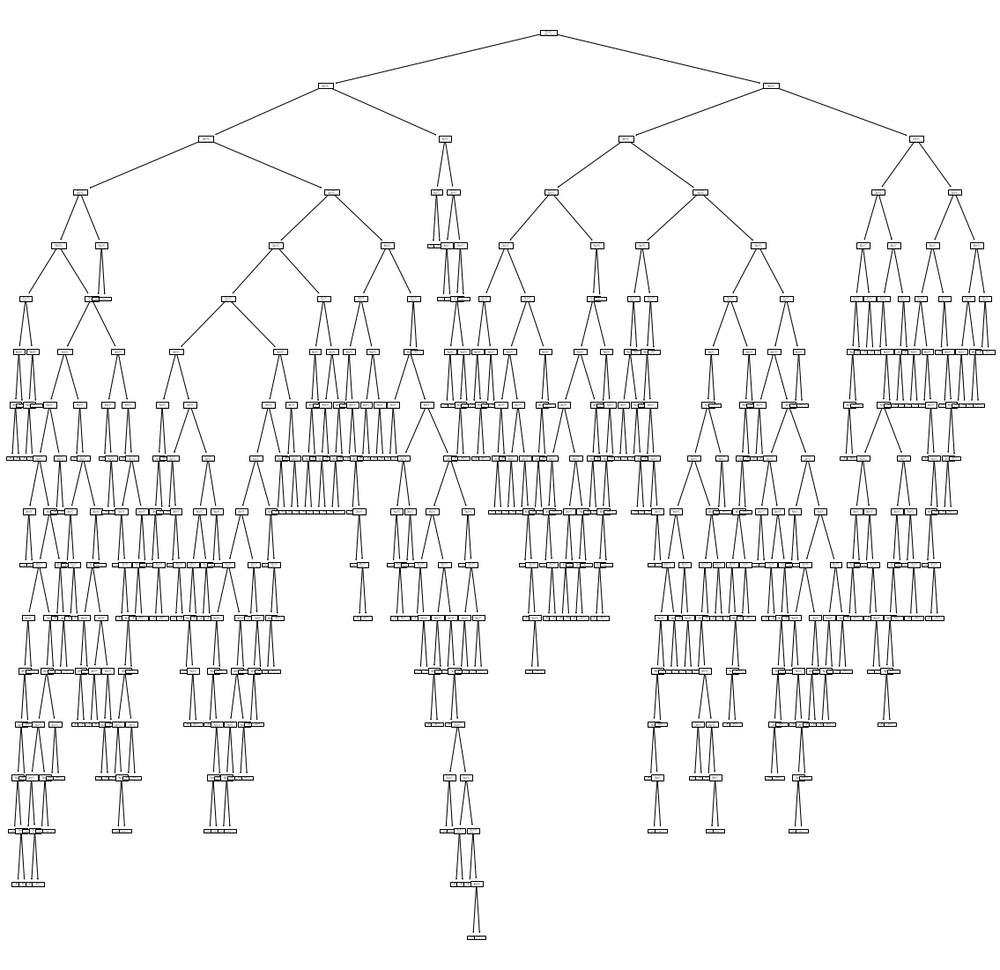

In [18]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model)

[Text(612.3411014089829, 1057.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(359.4493427445476, 996.6, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(223.6751916432736, 936.2, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(80.97837939969769, 875.8, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(56.55608939753832, 815.4000000000001, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(19.278773483049015, 755.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(11.56726408982941, 694.6, 'X[9] <= 0.54\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(7.711509393219607, 634.2, 'X[1] <= 0.55\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(3.8557546966098033, 573.8, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0, 0, 0]'),
 Text(11.5672640898294

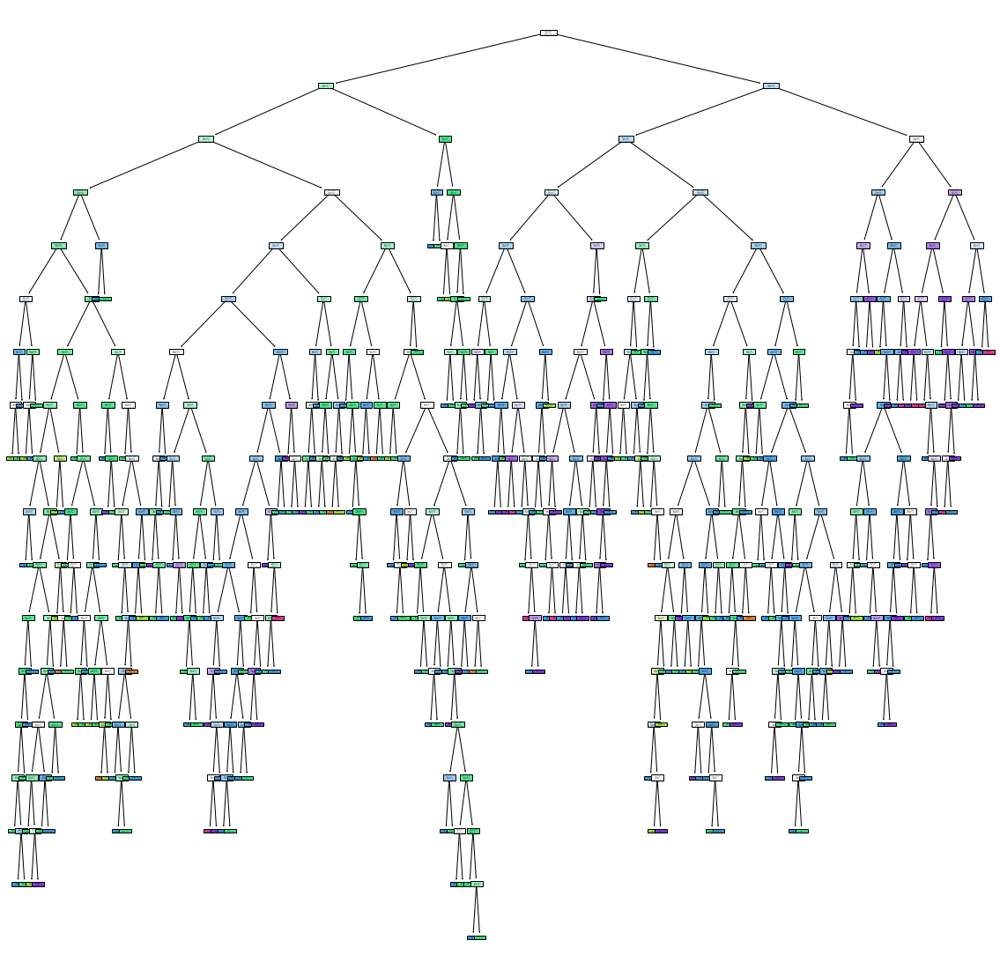

In [19]:
# to make the tree colourful use filled option

plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled=True)

In [20]:
# we are not able to understand the above tree as its very big size. SO in order to understand, we can take a small set of
# dataset and build the tree. lets select only 30-40 records and try to build the model

#  df1 = df.head(30)

# df1 = df.head(120)

df1 = df.head(500)

In [21]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0,6
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1,5
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8


In [22]:
x1 = df1.drop(columns = 'quality')

In [23]:
y1 = df1.quality

In [24]:
x1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0
496,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.9984,3.43,0.65,9.0
497,7.2,0.34,0.32,2.5,0.090,43.0,113.0,0.9966,3.32,0.79,11.1
498,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.9972,3.15,0.65,11.0


In [28]:
y1

0      5
1      5
2      5
3      6
4      5
      ..
495    8
496    6
497    5
498    8
499    6
Name: quality, Length: 500, dtype: int64

In [29]:
# we will build the tree on entire df1 dataset without splitting it into test and train as its a very small dataset

dt1_model = DecisionTreeClassifier()
dt1_model.fit(x1,y1)

DecisionTreeClassifier()

[Text(501.0417427007299, 1057.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(310.9475364963503, 996.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(196.26733576642334, 936.2, 'X[2] <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(82.98722627737226, 875.8, 'X[10] <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]'),
 Text(24.43795620437956, 815.4000000000001, 'X[9] <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]'),
 Text(16.291970802919707, 755.0, 'X[9] <= 0.515\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]'),
 Text(8.145985401459853, 694.6, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(24.43795620437956, 694.6, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(32.583941605839414, 755.0, 'gini = 0.0\nsamples = 9\nvalue = [0, 0, 0, 9, 0, 0]'),
 Text(141.53649635036496, 815.4000000000001, 'X[7] <= 0.999\ngini = 0

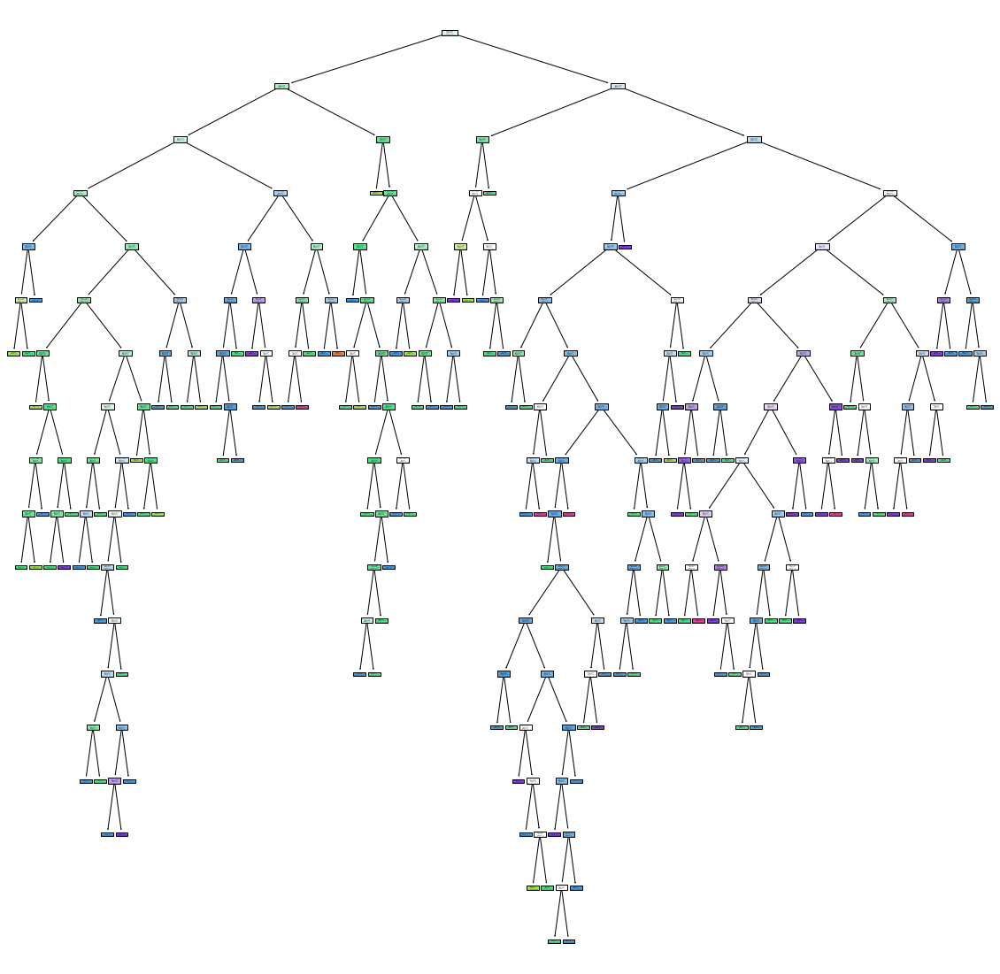

In [30]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt1_model, filled=True)

[Text(501.0417427007299, 1057.0, 'alcohol <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]\nclass = 5'),
 Text(310.9475364963503, 996.6, 'total sulfur dioxide <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]\nclass = 5'),
 Text(196.26733576642334, 936.2, 'citric acid <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]\nclass = 5'),
 Text(82.98722627737226, 875.8, 'alcohol <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]\nclass = 5'),
 Text(24.43795620437956, 815.4000000000001, 'sulphates <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]\nclass = 6'),
 Text(16.291970802919707, 755.0, 'sulphates <= 0.515\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]\nclass = 4'),
 Text(8.145985401459853, 694.6, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]\nclass = 4'),
 Text(24.43795620437956, 694.6, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]\nclass = 5'),
 Text(32.583941605839414, 755.0, 

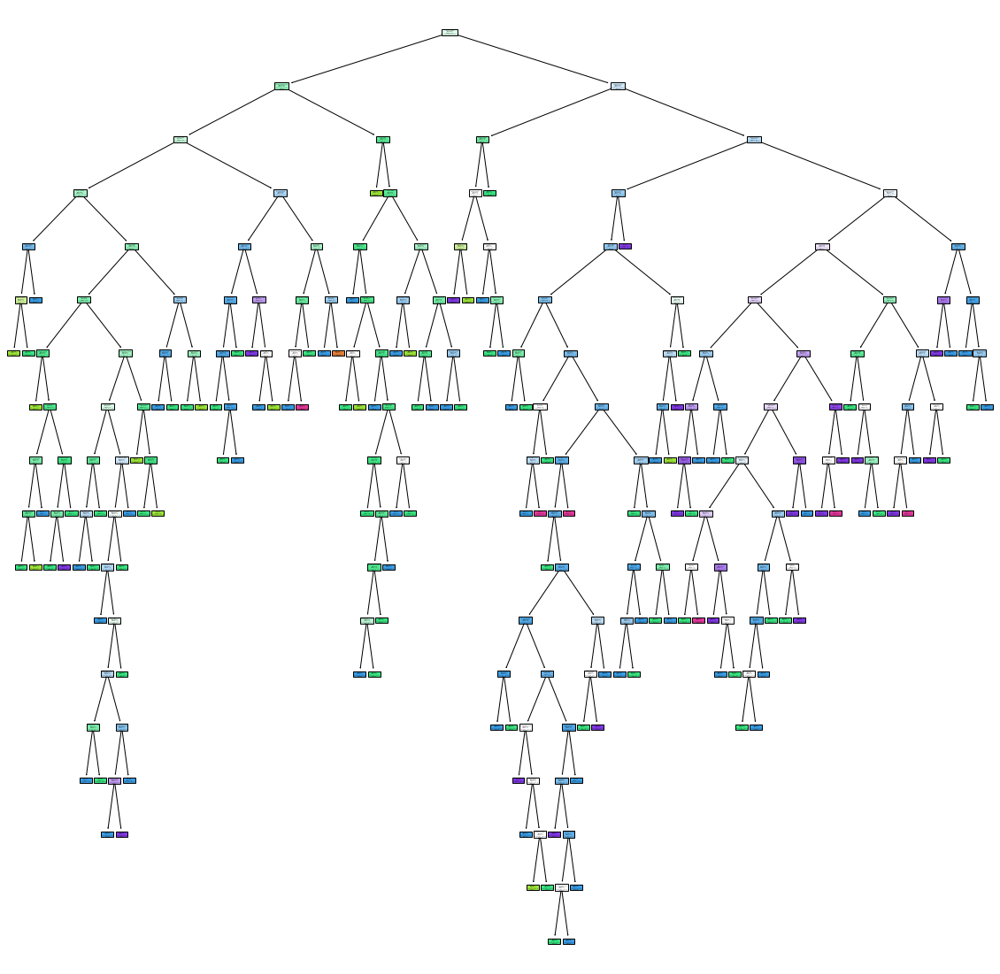

In [31]:
# we can print the feature names and class names as well

plt.figure(figsize=(20,20))
tree.plot_tree(dt1_model, filled=True, class_names=[str(i) for i in set(y1)] , feature_names=x1.columns)

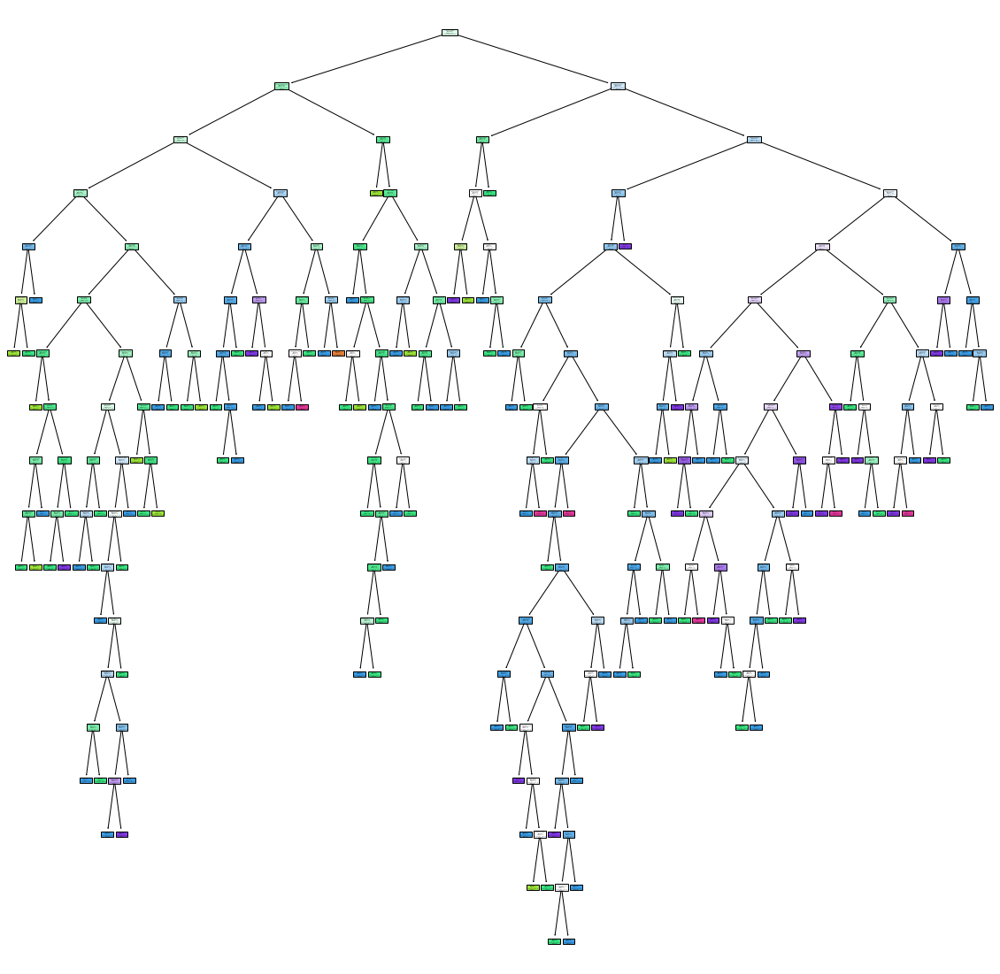

In [32]:
# lets try to save /download the tree

plt.figure(figsize=(20,20))
tree.plot_tree(dt1_model, filled=True, class_names=[str(i) for i in set(y1)] , feature_names=x1.columns)
plt.savefig('dt1_model')

In [33]:
dir()

['DecisionTreeClassifier',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 '_',
 '_10',
 '_12',
 '_13',
 '_15',
 '_17',
 '_18',
 '_19',
 '_21',
 '_24',
 '_25',
 '_26',
 '_27',
 '_28',
 '_29',
 '_3',
 '_30',
 '_31',
 '_4',
 '_5',
 '_8',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i19',
 '_i2',
 '_i20',
 '_i21',
 '_i22',
 '_i23',
 '_i24',
 '_i25',
 '_i26',
 '_i27',
 '_i28',
 '_i29',
 '_i3',
 '_i30',
 '_i31',
 '_i32',
 '_i33',
 '_i4',
 '_i5',
 '_i6',
 '_i7',
 '_i8',
 '_i9',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'accuracy_score',
 'confusion_matrix',
 'df',
 'df1',
 'dt1_model',
 'dt_model',
 'exit',
 'get_ipython',
 'np',
 'pd',
 'plt',
 'quit',
 'roc_auc_score',
 'roc_curve',
 'sklearn',
 'train_test_split',
 'tree',
 'x',
 'x1',
 'x_test',
 'x_train',
 'y',
 'y1',
 'y_test',
 'y_train']

[Text(501.0417427007299, 1057.0, 'alcohol <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]\nclass = 5'),
 Text(310.9475364963503, 996.6, 'total sulfur dioxide <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]\nclass = 5'),
 Text(196.26733576642334, 936.2, 'citric acid <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]\nclass = 5'),
 Text(82.98722627737226, 875.8, 'alcohol <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]\nclass = 5'),
 Text(24.43795620437956, 815.4000000000001, 'sulphates <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]\nclass = 6'),
 Text(16.291970802919707, 755.0, 'sulphates <= 0.515\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]\nclass = 4'),
 Text(8.145985401459853, 694.6, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]\nclass = 4'),
 Text(24.43795620437956, 694.6, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]\nclass = 5'),
 Text(32.583941605839414, 755.0, 

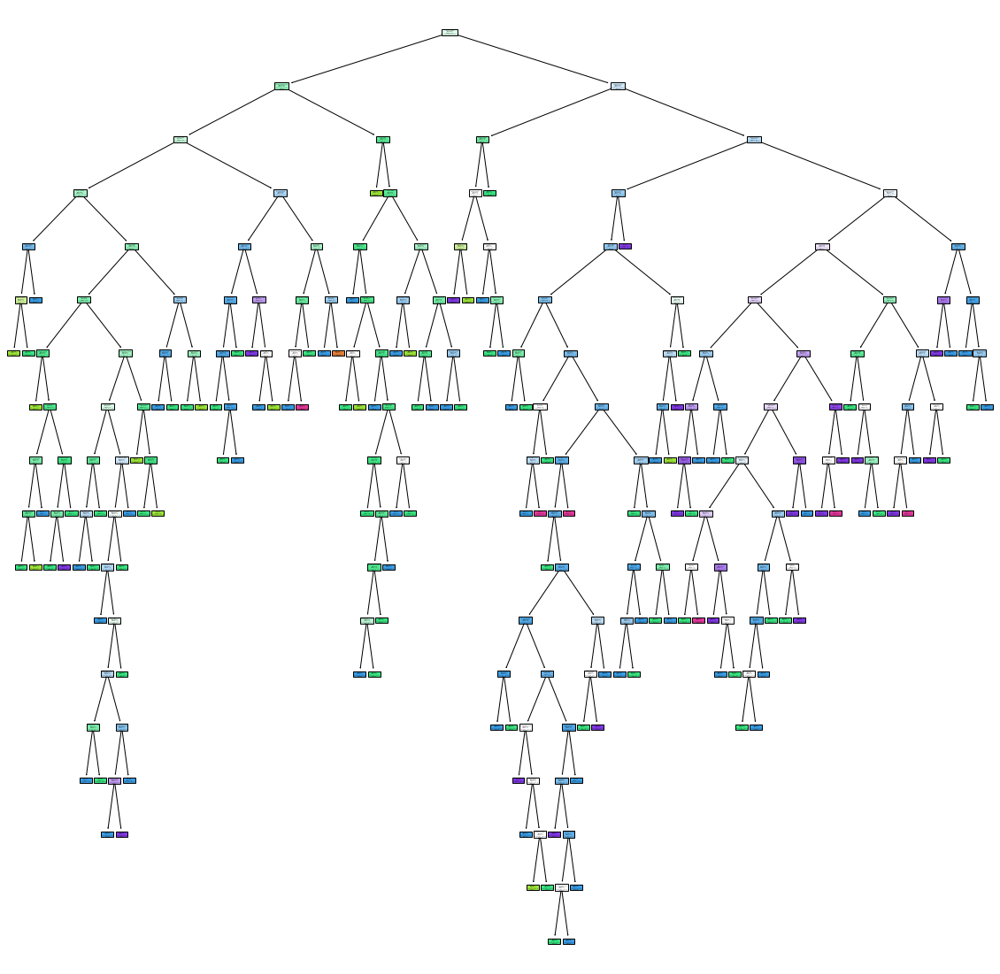

In [34]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt1_model, filled=True, class_names=[str(i) for i in set(y1)] , feature_names=x1.columns)

In [133]:
# from the above tree we can see that on left side tree is grown more. if we observ we can see that we can stop tree at 
# volatile acidity <= 0.415 as its having 20 records of class 5 and one record of class 6. by this we way can reduce the c
# complexicity of the tree by using pruning technique


In [35]:
# lets see what is the acuuracy of the model. before that first predict some of the values

dt1_model.predict(x1)



array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 6, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5,
       5, 6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 4, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5,
       5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6,
       7, 4, 7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5,
       6, 5, 5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6,
       6, 7, 7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5,
       5, 7, 4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5,
       6, 6, 7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6,

In [36]:
dt1_model.score(x1,y1) # here its giving 100% accuracy , we can see its a overfitted model
# its giving training accuracy as 1 and test accuarcy as 0.47. Its not a good model.So we need to use pruning
# technique to build the optimized tree

1.0

In [37]:
dt1_model.score(x_test, y_test)

0.595

In [38]:
path = dt1_model.cost_complexity_pruning_path(x1,y1)

In [39]:
path

{'ccp_alphas': array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
        0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.002     , 0.002     , 0.00261111,
        0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00271329,
        0.00272222, 0.003     , 0.003     , 0.003     , 0.003     ,
        0.00304762, 0.00305051, 0.00308418, 0.00325   , 0.00328205,
        0.00333333, 0.00333333, 0.00334032, 0.00336606, 0.00342857,
        0.00343316, 0.0035    , 0.0035    , 0.0036    , 0.00363636,
        0.00373809, 0.0038    , 0.0038237 , 0.004     , 0.00404444,
        0.00428571, 0.00437662, 0.00462338, 0.00465709, 0.00466667,
        0.0048    , 0.00495726, 0.00504242, 0.00508235, 0.00509091,
        0.00510606, 0.00516667, 0.00568485, 0.00589394, 0.00656364,
        0.00671079, 0.0067591 , 0.

In [40]:
path = dt1_model.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path['ccp_alphas']

In [41]:
ccp_alpha

array([0.        , 0.00175   , 0.00181818, 0.00184615, 0.00185   ,
       0.00186667, 0.00188235, 0.00192308, 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.002     , 0.002     , 0.002     , 0.00247552, 0.00261111,
       0.00262769, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00272222,
       0.003     , 0.003     , 0.003     , 0.003     , 0.00304762,
       0.00305051, 0.00308418, 0.00325   , 0.00328205, 0.00333333,
       0.00333333, 0.00334032, 0.00336606, 0.00342857, 0.00343316,
       0.0035    , 0.0035    , 0.0036    , 0.00363636, 0.00373809,
       0.0038    , 0.0038237 , 0.004     , 0.00404444, 0.00428571,
       0.00437662, 0.00462338, 0.00465709, 0.00466667, 0.0048    ,
       0.00495726, 0.00504242, 0.00508235, 0.00509091, 0.00510606,
       0.00516667, 0.00568485, 0.00589394, 0.00656364, 0.00671079,
       0.0067591 , 0.00688352, 0.00688889, 0.007     , 0.00701

In [42]:
path = dt1_model.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path.ccp_alphas

In [142]:
# ccp_alpha

In [43]:
# here we are trying to build different decision tree models for different ccp_alpha values. tHe above model dt1_modle is 
# having default ccp_alpha as 0. Now we will build different trees for above different values of ccp_alpha (pruning tech) 
# and see which model / tree is going to work fine for me

dt_model2 = []

for ccp in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)

In [44]:
dt_model2 # we can see we have built 8 models. nowe we have to select a model whihc is having a train and test accuarcy
# almost same or close together so that it wont end up in overfitting or underfitting model

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.00175),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.0018461538461538455),
 DecisionTreeClassifier(ccp_alpha=0.0018500000000000005),
 DecisionTreeClassifier(ccp_alpha=0.001882352941176471),
 DecisionTreeClassifier(ccp_alpha=0.0019230769230769243),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.0024755244755244737),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_al

In [45]:
# Train accuarcy

train_score = [i.score(x1,y1) for i in dt_model2]
    



In [46]:
train_score

[1.0,
 0.996,
 0.996,
 0.992,
 0.99,
 0.99,
 0.984,
 0.964,
 0.966,
 0.966,
 0.96,
 0.958,
 0.964,
 0.96,
 0.962,
 0.962,
 0.96,
 0.954,
 0.948,
 0.928,
 0.928,
 0.932,
 0.926,
 0.932,
 0.932,
 0.93,
 0.926,
 0.926,
 0.926,
 0.914,
 0.918,
 0.918,
 0.92,
 0.916,
 0.916,
 0.91,
 0.9,
 0.902,
 0.9,
 0.898,
 0.892,
 0.886,
 0.884,
 0.882,
 0.886,
 0.878,
 0.878,
 0.88,
 0.87,
 0.866,
 0.862,
 0.86,
 0.858,
 0.846,
 0.842,
 0.848,
 0.834,
 0.818,
 0.824,
 0.81,
 0.804,
 0.802,
 0.794,
 0.79,
 0.786,
 0.784,
 0.78,
 0.776,
 0.776,
 0.772,
 0.768,
 0.762,
 0.758,
 0.742,
 0.728,
 0.718,
 0.698,
 0.69,
 0.682,
 0.676,
 0.676,
 0.636,
 0.636,
 0.596,
 0.596,
 0.558,
 0.478]

In [47]:
# test score

test_score = [i.score(x_test, y_test) for i in dt_model2]

In [48]:
test_score

[0.575,
 0.59,
 0.5925,
 0.595,
 0.5825,
 0.595,
 0.585,
 0.605,
 0.5775,
 0.5925,
 0.5725,
 0.5725,
 0.5675,
 0.575,
 0.5875,
 0.5625,
 0.5875,
 0.5675,
 0.59,
 0.5975,
 0.59,
 0.6075,
 0.5825,
 0.59,
 0.5975,
 0.6125,
 0.6025,
 0.6025,
 0.5925,
 0.59,
 0.5825,
 0.6,
 0.585,
 0.5925,
 0.5925,
 0.6025,
 0.6,
 0.6025,
 0.6,
 0.6125,
 0.5925,
 0.6075,
 0.6,
 0.6075,
 0.605,
 0.6075,
 0.605,
 0.6025,
 0.6025,
 0.5975,
 0.605,
 0.615,
 0.61,
 0.6075,
 0.6075,
 0.61,
 0.61,
 0.605,
 0.6075,
 0.6125,
 0.6175,
 0.6175,
 0.61,
 0.6075,
 0.6075,
 0.6,
 0.59,
 0.59,
 0.5875,
 0.585,
 0.5825,
 0.5925,
 0.59,
 0.585,
 0.5825,
 0.5825,
 0.56,
 0.5725,
 0.5625,
 0.555,
 0.555,
 0.54,
 0.54,
 0.5775,
 0.5775,
 0.545,
 0.4225]

In [149]:
#plot a graph to see the relationship between train and test score

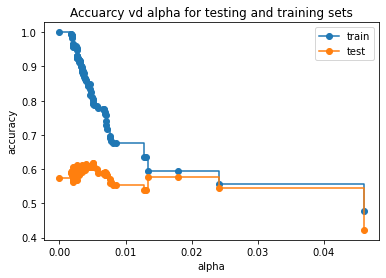

In [49]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuarcy vd alpha for testing and training sets")
ax.plot(ccp_alpha, train_score , marker ='o' , label ='train' , drawstyle = "steps-post")
ax.plot(ccp_alpha, test_score , marker ='o' , label ='test' , drawstyle = "steps-post")
ax.legend()
plt.show()

In [ ]:
# from the above graph we can see that when ccp-alpha = 0 then there is a huge difference in train(1) and test (0.47) accua
#racy, we can see that if we take ccp alpha > 0.12 then train and test accuracy are sonwwhat closer to each other test =0.4 
# and train =0.7. we know that for train we have taken only 30 recs and for test we have taken 400+ recs.
# what is the solution? 
# we need to increase the train data. increase the train data and execute all the above steps

# we can see that now the accuracy are closer when alpha is between 0.01 and 0.02. so first solution is to increase the train dataset size.
# so ccp alpha is a hyper parameter

In [50]:
# now lets a build a model by keeping the ccp alpha value

dt_model_ccp = DecisionTreeClassifier(random_state =0, ccp_alpha = .014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(558.0, 906.0, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(279.0, 543.6, 'X[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(139.5, 181.19999999999993, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(418.5, 181.19999999999993, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(837.0, 543.6, 'X[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(697.5, 181.19999999999993, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(976.5, 181.19999999999993, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

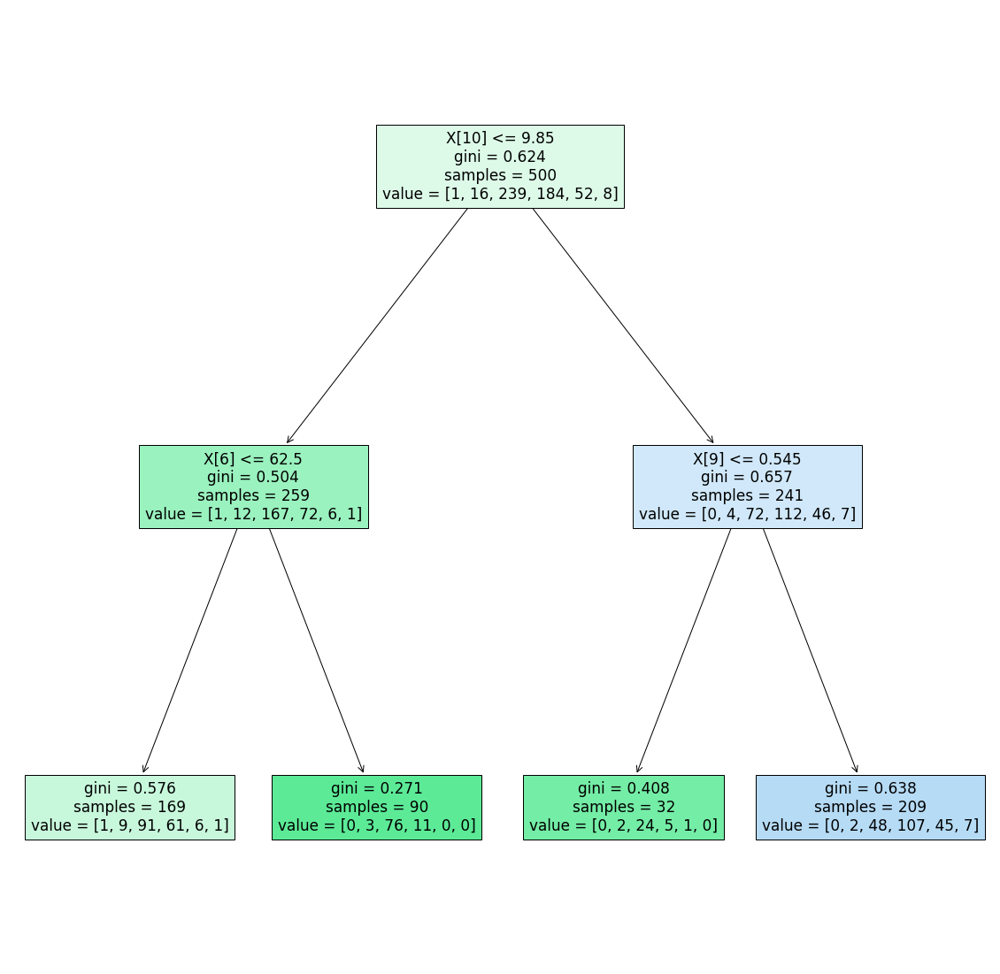

In [51]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp, filled=True)

In [52]:
dt_model_ccp.score(x1,y1)

0.596

In [53]:
dt_model_ccp.score(x_test,y_test)

0.5775

We can see that DecisionTreeClassifier has lot of parameters like ccp_alpha. here in the above example we have manually found out what is the optimum value of ccp alpha that will avoide the overfitting or underfitting of the model.
If we go by manual effort it will take lot of time to tune all the parameters available. so we use GridserachCV or randomCV
which will find out the best values for all the parameters

In [54]:
grid_param = {"criterion" : ['gini' , 'entropy'],
             "splitter"  : ['best' , 'random'],
             "max_depth" : range(2,40,1),
              "min_samples_split" : range(2,10,1),
              "min_samples_leaf" : range(1,10,1)
              
             }

In [55]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp, param_grid=grid_param, cv = 5 , n_jobs = -1)

In [56]:
grid_ccp.fit(x1,y1)

C:\Users\anand\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:672: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [57]:
grid_ccp.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'splitter': 'random'}

In [58]:
# we have got best parameters, now lets build a new model with above parameters

dt_cpp_new = DecisionTreeClassifier(criterion = 'entropy',max_depth = 17 ,min_samples_leaf = 2,  min_samples_split = 2,splitter = 'random' , ccp_alpha = 0.014) 

In [59]:
dt_cpp_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=17,
                       min_samples_leaf=2, splitter='random')

In [60]:
dt_cpp_new.score(x1,y1)

0.662

In [61]:
dt_cpp_new.score(x_test, y_test)

0.59

In [62]:
pred = dt_cpp_new.predict(x_train)


In [63]:
confusion_matrix(y_train,pred)

array([[  0,   0,   6,   2,   0,   0],
       [  0,   0,  27,   8,   0,   0],
       [  0,   0, 432,  78,   2,   0],
       [  0,   0, 202, 272,   3,   0],
       [  0,   0,  22, 127,   4,   0],
       [  0,   0,   0,  14,   0,   0]], dtype=int64)

# Random forest

In [64]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [65]:
x = df.drop(columns='quality')

In [66]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [67]:
y = df.quality

In [68]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [69]:
from sklearn.ensemble import BaggingClassifier


In [70]:
x_train, x_test, y_train, y_test = train_test_split(x,y,random_state = 0)

In [71]:
y_test  # by default test_size = .25 will be taken

1109    6
1032    5
1002    7
487     6
979     5
       ..
489     6
362     5
526     5
442     7
1229    5
Name: quality, Length: 400, dtype: int64

In [72]:
bag_dt = BaggingClassifier(DecisionTreeClassifier() , n_estimators=10)

In [73]:
bag_dt.fit(x_train , y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [74]:
bag_dt.predict(x_test)

array([6, 5, 7, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 4, 6, 7, 7, 5, 5, 6, 6, 5,
       6, 7, 5, 5, 5, 7, 5, 5, 6, 6, 6, 6, 6, 7, 5, 6, 6, 4, 5, 6, 7, 7,
       6, 5, 5, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 7, 6, 5, 6, 6, 6, 5, 6,
       5, 5, 7, 6, 5, 5, 5, 6, 6, 6, 5, 5, 5, 7, 6, 5, 4, 6, 6, 5, 6, 5,
       5, 5, 5, 6, 6, 5, 7, 5, 6, 5, 5, 5, 7, 6, 6, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 7, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 5, 7, 6, 5, 5, 5, 7, 5, 6,
       6, 5, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 7, 6, 5, 5, 6, 5, 5, 5,
       6, 6, 6, 6, 6, 5, 5, 5, 7, 5, 5, 5, 6, 6, 6, 6, 6, 6, 4, 7, 4, 6,
       7, 7, 7, 5, 5, 7, 6, 6, 7, 5, 6, 6, 5, 6, 7, 5, 6, 6, 5, 5, 5, 6,
       6, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 5, 6, 5, 5, 6, 5,
       5, 5, 6, 5, 6, 6, 6, 5, 6, 6, 5, 6, 6, 5, 6, 6, 6, 7, 7, 6, 5, 6,
       5, 5, 6, 5, 6, 5, 5, 7, 6, 5, 5, 5, 6, 6, 5, 5, 5, 7, 5, 6, 5, 6,
       6, 5, 5, 5, 5, 7, 5, 5, 5, 5, 7, 6, 6, 6, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 6, 5, 5, 6,

In [75]:
bag_dt.base_estimator

DecisionTreeClassifier()

In [76]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [77]:
bag_dt.estimator_params

()

In [78]:
from sklearn.neighbors import KNeighborsClassifier

In [79]:
bag_knn = BaggingClassifier(KNeighborsClassifier(6) , n_estimators=10)

In [80]:
bag_knn.fit(x_train,y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [81]:
bag_knn.predict(x_test)

array([5, 6, 7, 6, 6, 5, 6, 6, 6, 5, 5, 6, 5, 5, 6, 6, 7, 6, 5, 6, 6, 6,
       6, 5, 3, 5, 6, 6, 5, 6, 6, 6, 5, 6, 6, 6, 5, 6, 6, 6, 6, 7, 6, 5,
       6, 6, 5, 6, 5, 5, 5, 5, 6, 7, 6, 5, 5, 5, 7, 5, 5, 6, 6, 5, 5, 5,
       5, 7, 8, 7, 5, 5, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 5, 6, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 6, 5, 5, 5, 6, 6, 5, 7, 5, 6, 6, 6, 6, 6, 6, 6, 5,
       6, 5, 6, 6, 5, 7, 5, 7, 7, 6, 5, 7, 6, 5, 5, 6, 5, 5, 5, 6, 6, 5,
       6, 5, 6, 5, 6, 5, 6, 5, 6, 6, 5, 6, 5, 6, 6, 7, 6, 6, 5, 5, 6, 6,
       5, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 5, 6, 5, 5, 5, 5, 7, 6, 7, 7, 5,
       5, 7, 6, 5, 5, 6, 6, 6, 7, 5, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 6, 5, 5, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 6, 6, 5,
       6, 5, 6, 6, 5, 5, 5, 5, 6, 5, 5, 6, 5, 5, 7, 6, 7, 6, 7, 7, 6, 5,
       6, 6, 5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 6, 5, 5, 6, 7, 6, 6, 5, 5, 5, 5,
       6, 5, 6, 6, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6,

In [82]:
from sklearn.ensemble import RandomForestClassifier

In [83]:
rf = RandomForestClassifier()

In [84]:
rf.fit(x_train,y_train)

RandomForestClassifier()

In [85]:
rf.score(x_train,y_train)

1.0

In [86]:
rf.score(x_test,y_test)

0.685

In [87]:
bag_dt.score(x_test,y_test)

0.66

In [88]:
bag_knn.score(x_test,y_test)

0.48

In [219]:
# by default Random forest will use 100 estimators i,e 100 decision trees it will use.Lets reduce the no of estimators

In [89]:
rf = RandomForestClassifier(n_estimators=5)

In [90]:
rf.fit(x_train,y_train)
rf.score(x_train,y_train)

0.9616346955796498

In [91]:
rf.score(x_test,y_test)

0.615

In [92]:
rf.estimators_

[DecisionTreeClassifier(max_features='auto', random_state=2011096142),
 DecisionTreeClassifier(max_features='auto', random_state=2011007652),
 DecisionTreeClassifier(max_features='auto', random_state=1377079474),
 DecisionTreeClassifier(max_features='auto', random_state=986366046),
 DecisionTreeClassifier(max_features='auto', random_state=802878691)]

In [93]:
rf.estimators_[0]


DecisionTreeClassifier(max_features='auto', random_state=2011096142)

[Text(646.8620603091529, 1055.2235294117647, 'X[1] <= 0.555\ngini = 0.636\nsamples = 750\nvalue = [11, 37, 531, 468, 146, 6]'),
 Text(451.94451375365145, 991.2705882352941, 'X[6] <= 86.5\ngini = 0.64\nsamples = 426\nvalue = [3, 11, 212, 321, 118, 6]'),
 Text(269.27948515092504, 927.3176470588236, 'X[2] <= 0.315\ngini = 0.632\nsamples = 375\nvalue = [3, 11, 154, 301, 113, 6]'),
 Text(114.37098344693283, 863.364705882353, 'X[3] <= 1.85\ngini = 0.581\nsamples = 146\nvalue = [0, 10, 86, 134, 17, 1]'),
 Text(57.59298928919182, 799.4117647058824, 'X[4] <= 0.08\ngini = 0.569\nsamples = 48\nvalue = [0, 2, 50, 39, 5, 1]'),
 Text(36.94644595910419, 735.4588235294118, 'X[9] <= 0.745\ngini = 0.598\nsamples = 38\nvalue = [0, 2, 29, 34, 5, 1]'),
 Text(32.59980525803311, 671.5058823529412, 'X[2] <= 0.185\ngini = 0.611\nsamples = 32\nvalue = [0, 2, 29, 23, 5, 1]'),
 Text(8.693281402142162, 607.5529411764707, 'X[7] <= 0.994\ngini = 0.557\nsamples = 19\nvalue = [0, 2, 23, 7, 5, 0]'),
 Text(4.34664070107

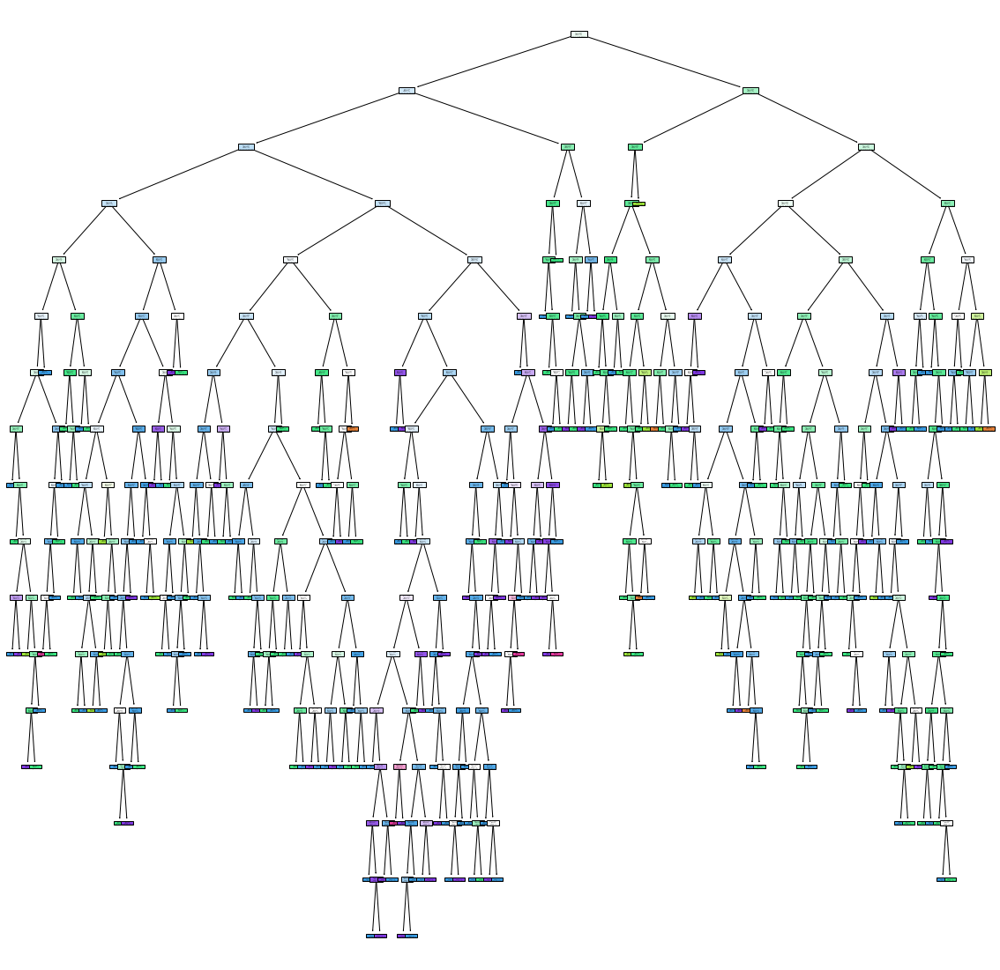

In [94]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf.estimators_[0], filled=True)

[Text(389.98846595884413, 1055.2235294117647, 'X[1] <= 0.365\ngini = 0.648\nsamples = 758\nvalue = [8, 38, 501, 478, 159, 15]'),
 Text(150.49387040280212, 991.2705882352941, 'X[6] <= 29.5\ngini = 0.64\nsamples = 145\nvalue = [0, 2, 34, 112, 77, 9]'),
 Text(97.9676007005254, 927.3176470588236, 'X[2] <= 0.55\ngini = 0.632\nsamples = 71\nvalue = [0, 0, 13, 45, 53, 6]'),
 Text(66.94045534150614, 863.364705882353, 'X[4] <= 0.078\ngini = 0.628\nsamples = 59\nvalue = [0, 0, 11, 33, 49, 6]'),
 Text(34.20315236427321, 799.4117647058824, 'X[10] <= 10.25\ngini = 0.574\nsamples = 42\nvalue = [0, 0, 6, 17, 43, 6]'),
 Text(15.635726795096323, 735.4588235294118, 'X[10] <= 9.25\ngini = 0.574\nsamples = 11\nvalue = [0, 0, 2, 11, 3, 2]'),
 Text(7.8178633975481615, 671.5058823529412, 'X[7] <= 0.999\ngini = 0.444\nsamples = 3\nvalue = [0, 0, 2, 1, 0, 0]'),
 Text(3.9089316987740808, 607.5529411764707, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(11.726795096322242, 607.5529411764707, 'X[6]

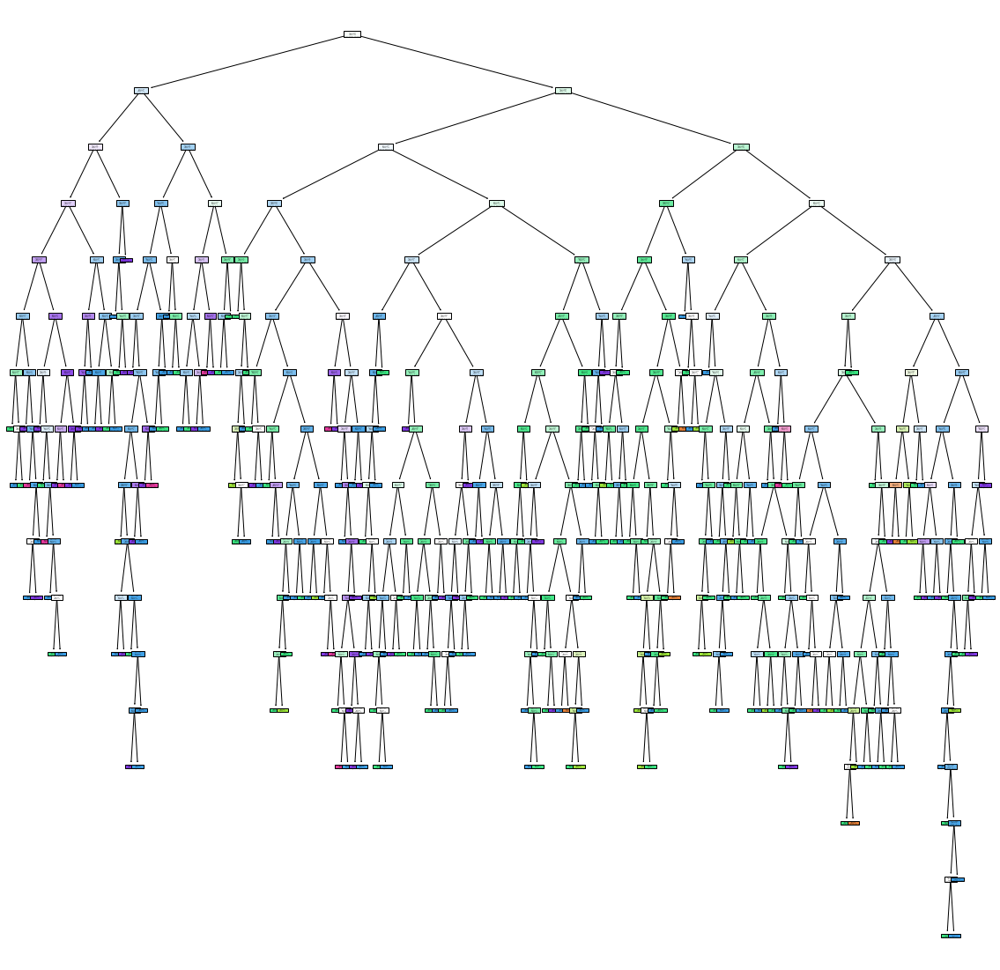

In [95]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf.estimators_[1], filled=True)

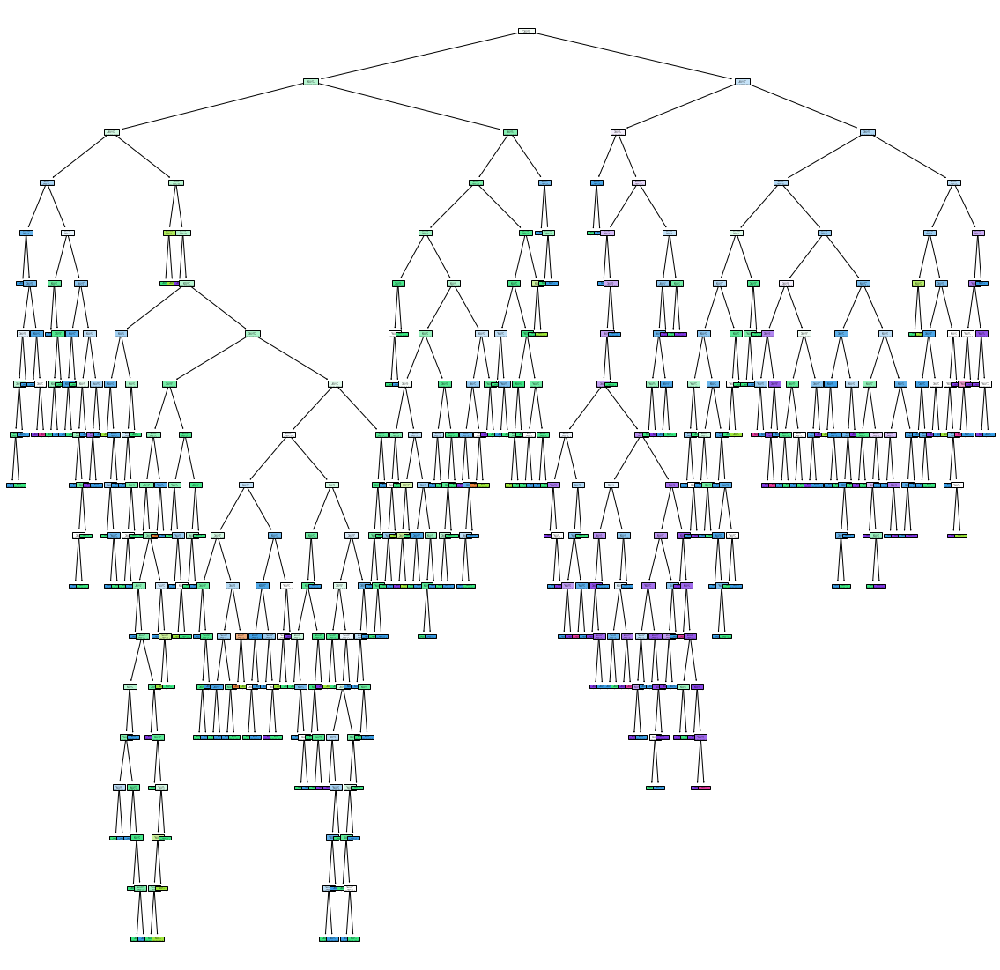

In [96]:
# to draw all the random forest trees

plt.figure(figsize=(20,20))
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i], filled=True)

In [242]:
grid_param = {"n_estimators" : [5,10,50,100,120,150],
             'criterion' : ['gini' , 'entorpy'],
             "max_depth" : range(10),
             'min_samples_leaf' : range(10)}

In [243]:
rf = RandomForestClassifier(n_estimators=5)

In [244]:
grid_search_rf = GridSearchCV(estimator=rf,param_grid=grid_param, cv = 10, n_jobs =6, verbose =1,  )

In [245]:
grid_search_rf


GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=5), n_jobs=6,
             param_grid={'criterion': ['gini', 'entorpy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100, 120, 150]},
             verbose=1)

In [246]:
grid_search_rf.fit(x_train,y_train)

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


C:\Users\anand\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:672: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)
[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  38 tasks      | elapsed:    3.2s
[Parallel(n_jobs=6)]: Done 578 tasks      | elapsed:    8.0s
[Parallel(n_jobs=6)]: Done 1038 tasks      | elapsed:   27.3s
[Parallel(n_jobs=6)]: Done 1738 tasks      | elapsed:  1.0min
[Parallel(n_jobs=6)]: Done 2638 tasks      | elapsed:  1.7min
[Parallel(n_jobs=6)]: Done 3468 tasks      | elapsed:  2.5min
[Parallel(n_jobs=6)]: Done 4252 tasks      | elapsed:  3.2min
[Parallel(n_jobs=6)]: Done 5126 tasks      | elapsed:  4.1min
[Parallel(n_jobs=6)]: Done 6042 tasks      | elapsed:  5.0min
[Parallel(n_jobs=6)]: Done 12000 out of 12000 | elapsed:  5.7min finished


GridSearchCV(cv=10, estimator=RandomForestClassifier(n_estimators=5), n_jobs=6,
             param_grid={'criterion': ['gini', 'entorpy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100, 120, 150]},
             verbose=1)

In [247]:
grid_search_rf.best_params_

{'criterion': 'gini',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'n_estimators': 100}

In [250]:
rf_new = RandomForestClassifier(criterion='gini', max_depth= 9, min_samples_leaf = 1, n_estimators=100)

In [251]:
rf_new.fit(x_train,y_train)

RandomForestClassifier(max_depth=9)

In [252]:
rf_new.score(x_test,y_test)

0.68

[Text(461.31529017857144, 1032.8400000000001, 'X[10] <= 10.25\ngini = 0.649\nsamples = 772\nvalue = [2, 46, 512, 462, 163, 14]'),
 Text(285.2276785714286, 924.1200000000001, 'X[0] <= 11.0\ngini = 0.535\nsamples = 403\nvalue = [1, 33, 376, 189, 20, 1]'),
 Text(203.4375, 815.4000000000001, 'X[6] <= 98.5\ngini = 0.513\nsamples = 372\nvalue = [1, 31, 367, 162, 15, 1]'),
 Text(117.91071428571429, 706.6800000000001, 'X[0] <= 6.85\ngini = 0.555\nsamples = 312\nvalue = [1, 31, 281, 155, 15, 1]'),
 Text(36.535714285714285, 597.96, 'X[0] <= 6.25\ngini = 0.339\nsamples = 41\nvalue = [0, 4, 53, 7, 2, 0]'),
 Text(13.285714285714286, 489.24, 'X[9] <= 0.59\ngini = 0.593\nsamples = 11\nvalue = [0, 4, 11, 3, 1, 0]'),
 Text(6.642857142857143, 380.5200000000001, 'gini = 0.0\nsamples = 5\nvalue = [0, 0, 8, 0, 0, 0]'),
 Text(19.92857142857143, 380.5200000000001, 'X[5] <= 7.0\ngini = 0.711\nsamples = 6\nvalue = [0, 4, 3, 3, 1, 0]'),
 Text(13.285714285714286, 271.80000000000007, 'gini = 0.0\nsamples = 2\nval

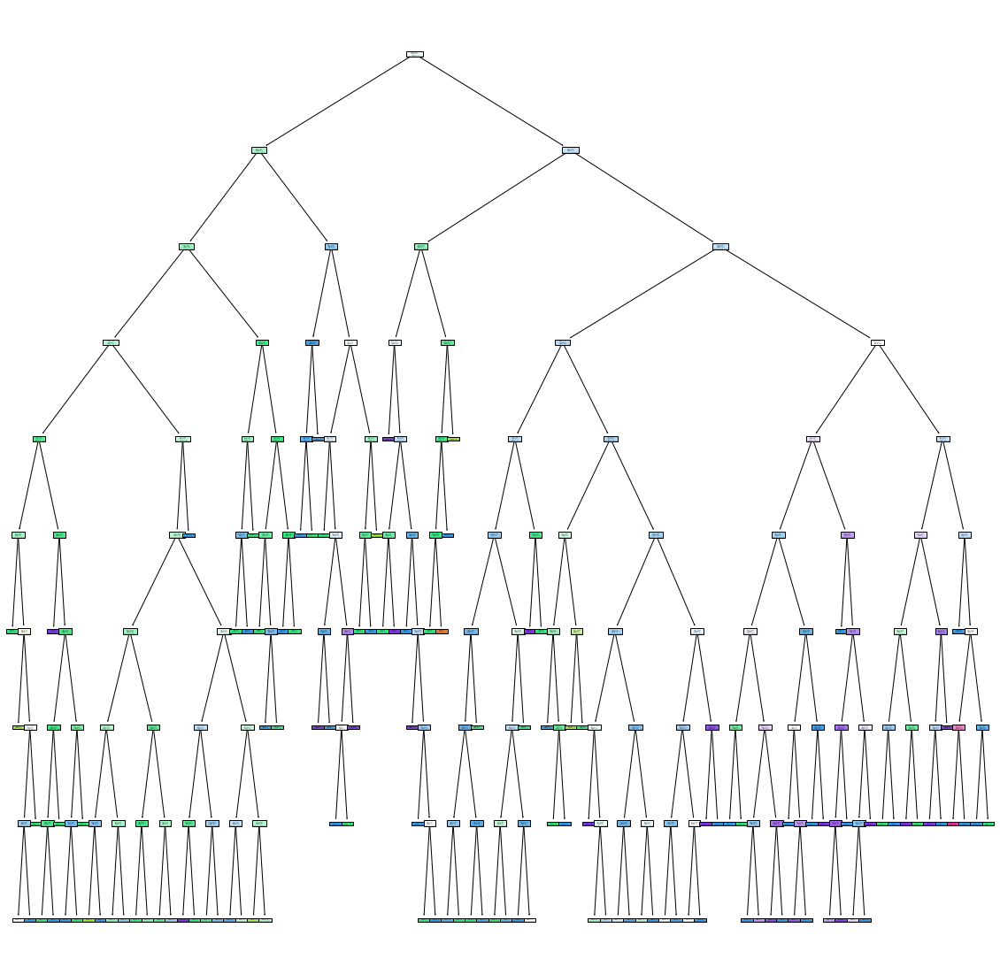

In [253]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf_new.estimators_[0], filled=True)